In [1]:
from tensorflow import lite
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import pandas as pd
import random, os
import shutil
import time
import itertools
import pathlib
import matplotlib.pyplot as plt 
from matplotlib.image import imread

from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.metrics import categorical_accuracy 
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers, models
from tensorflow.keras import applications
from torch import nn


# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
save_path = "C:/Users/Aum Sathwara/Documents/Aum/Workplace/Python/PROJECTS/Deep Learning Project"
custome_model_weights = "conv2d-Diabetic Retinopathy Detection-weights.h5"

In [3]:
data_dir = "F:/Deep Learning/Diabetic Retinopathy/gaussian_filtered_images/gaussian_filtered_images"
filepaths = []
labels = []

In [4]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
folds = os.listdir(data_dir)
print(folds)

Num GPUs Available:  1
['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']


In [5]:
# gpus = tf.config.experimental.list_physical_devices('GPU')
# if gpus:
#     try:
#         # Currently, memory growth needs to be the same across GPUs
#         for gpu in gpus:
#             tf.config.experimental.set_memory_growth(gpu, True)
#         logical_gpus = tf.config.experimental.list_logical_devices('GPU')
#         print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
#     except RuntimeError as e:
#         # Memory growth must be set before GPUs have been initialized
#         print(e)

In [6]:
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    if pathlib.Path(foldpath).suffix == "":
        filelist = os.listdir(foldpath)
        
        for file in filelist:
            fpath = os.path.join(foldpath, file)
            filepaths.append(fpath)
#             print(filepaths)
            labels.append(fold)
#             print(labels)

In [7]:
Fseries = pd.Series(filepaths, name = "filepaths")
Lseries = pd.Series(labels, name="labels")
df = pd.concat([Fseries, Lseries], axis=1)

In [8]:
print(df)

                                              filepaths  labels
0     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
1     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
2     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
3     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
4     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
...                                                 ...     ...
3657  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3658  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3659  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3660  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3661  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe

[3662 rows x 2 columns]


In [9]:
train_df, dummy_df = train_test_split(df, train_size=0.8 , shuffle= True, random_state=123)
valid_df, test_df = train_test_split(dummy_df, train_size=0.6, shuffle=True, random_state= 123)

In [10]:
batch_size = 32
img_size = (224,224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

In [11]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length+1) if ts_length%n == 0 and ts_length/n <=80]))
test_steps = ts_length // test_batch_size

In [12]:
def scaler(img):
    return img

In [13]:
tr_gen = ImageDataGenerator(preprocessing_function=scaler)
ts_gen = ImageDataGenerator(preprocessing_function=scaler)

In [39]:
train_gen = tr_gen.flow_from_dataframe(dataframe=train_df, 
                                       x_col="filepaths" , 
                                       y_col="labels", 
                                       target_size=img_size, 
                                       class_mode='sparse', 
                                       color_mode="rgb", 
                                       shuffle=True, 
                                       batch_size=batch_size)

Found 2929 validated image filenames belonging to 5 classes.


In [15]:
valid_gen = ts_gen.flow_from_dataframe(dataframe=valid_df, 
                                       x_col="filepaths" , 
                                       y_col="labels", 
                                       target_size=img_size, 
                                       class_mode='sparse', 
                                       color_mode="rgb", 
                                       shuffle=True, 
                                       batch_size=batch_size)

Found 439 validated image filenames belonging to 5 classes.


In [16]:
test_gen = ts_gen.flow_from_dataframe(dataframe=test_df, 
                                       x_col="filepaths" , 
                                       y_col="labels", 
                                       target_size=img_size, 
                                       class_mode='sparse', 
                                       color_mode="rgb", 
                                       shuffle=True, 
                                       batch_size=batch_size)

Found 294 validated image filenames belonging to 5 classes.


In [17]:
g_dict = train_gen.class_indices
classes = list(g_dict.keys())
images, labels = next(train_gen)

In [18]:
length = len(labels)
sample = min(length, 25) 

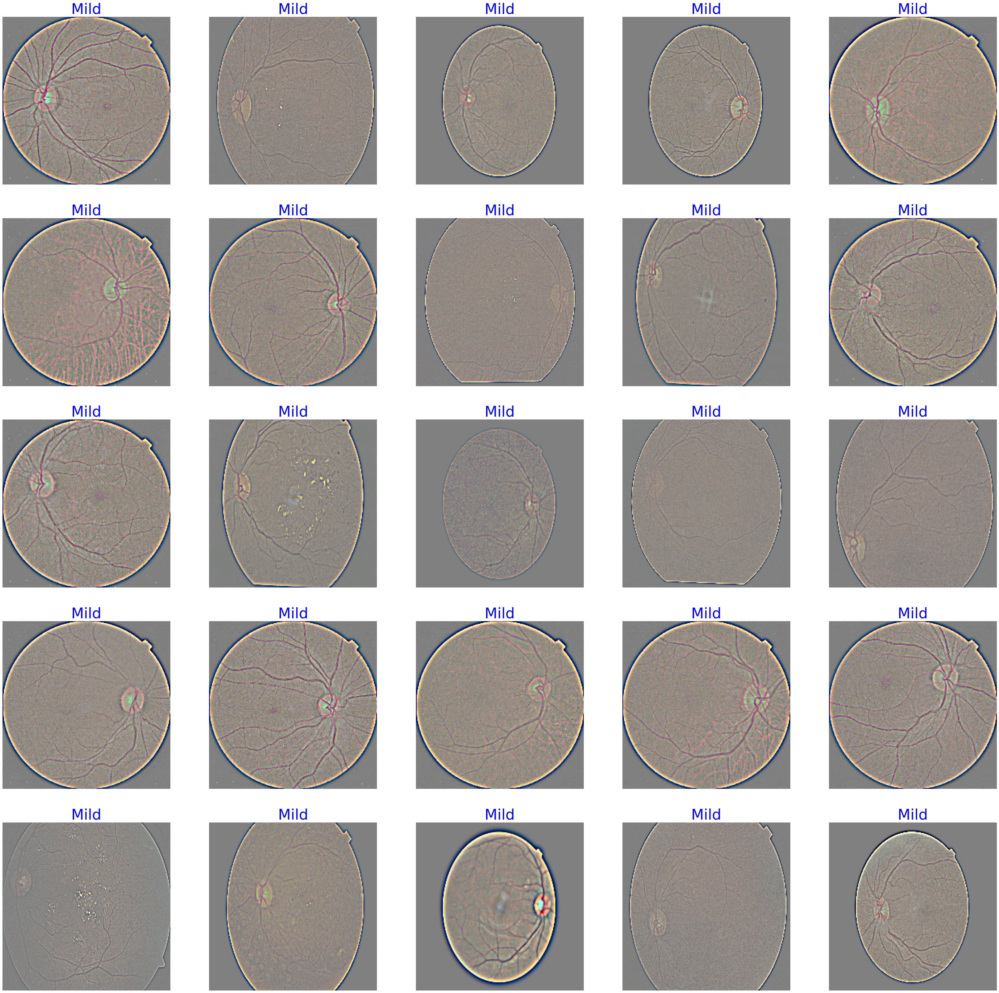

In [19]:
plt.figure(figsize= (50,50))
for i in range(sample):
    plt.subplot(5,5, i + 1)
    image = images[i] / 255    # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'blue', fontsize= 41)
    plt.axis('off')
plt.show()

In [20]:
class MyCallback(keras.callbacks.Callback):
    def __init__(self, model, patience, stop_patience, threshold, factor, batches, epoches, ask_epoch):
        super(MyCallback, self).__init__()
        self.model = model
        self.patience = patience
        self.stop_patience = stop_patience
        self.threshold = threshold
        self.factor = factor
        self.batches = batches
        self.epoches = epoches
        self.ask_epoch = ask_epoch
        
        self.ask_epoch_intial = ask_epoch
        
        
        self.count = 0 
        self.stop_count = 0
        self.best_epoch = 1
        self.initial_lr = float(tf.keras.backend.get_value(model.optimizer.lr))
        self.highest_tracc = 0.0
        self.lowest_vloss = np.inf
        self.best_weights = self.model.get_weights()
        self.initial_weights = self.model.get_weights()
        
    def on_train_begin(self, logs = None):
        msg = "Do you want model asks you to halt the training [y/n]"
        print(msg)
        ans = input('')
        if ans in ['Y', 'y']:
            self.ask_permission = 1
        elif ans in ['N', 'n']:
            self.ask_permission = 0
    
        msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
        print(msg)
        self.start_time = time.time()
        
    def on_train_end(self, logs = None):
        stop_time = time.time()
        tr_duration = stop_time - self.start_time
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))

        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print(msg)
        self.model.set_weights(self.best_weights)
    

    def on_train_batch_end(self, batch, logs= None):
        acc = logs.get('accuracy') * 100
        loss = logs.get('loss')

        msg = '{0:20s}processing batch {1:} of {2:5s}-   accuracy=  {3:5.3f}   -   loss: {4:8.5f}'.format(' ', str(batch), str(self.batches), acc, loss)
        print(msg, '\r', end= '')
        
    def on_epoch_begin(self, epoch, logs= None):
        self.ep_start = time.time()
        
    
    def on_epoch_end(self, epoch, logs= None):
        ep_end = time.time()
        duration = ep_end - self.ep_start

        lr = float(tf.keras.backend.get_value(self.model.optimizer.lr)) 
        current_lr = lr
        acc = logs.get('accuracy')  
        v_acc = logs.get('val_accuracy')  
        loss = logs.get('loss') 
        v_loss = logs.get('val_loss')  
        
        if acc < self.threshold: 
            monitor = 'accuracy'
            if epoch == 0:
                pimprov = 0.0
            else:
                pimprov = (acc - self.highest_tracc ) * 100 / self.highest_tracc 
                
            if acc > self.highest_tracc:
                self.highest_tracc = acc 
                self.best_weights = self.model.get_weights() 
                self.count = 0 
                self.stop_count = 0
                if v_loss < self.lowest_vloss:
                    self.lowest_vloss = v_loss
                self.best_epoch = epoch + 1 
           
            else:
                
                if self.count >= self.patience - 1:
                    lr = lr * self.factor 
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr)
                    self.count = 0 
                    self.stop_count = self.stop_count + 1
                    self.count = 0 
                    if v_loss < self.lowest_vloss:
                        self.lowest_vloss = v_loss
                else:
                    self.count = self.count + 1 
        
        else: 
            monitor = 'val_loss'
            if epoch == 0:
                pimprov = 0.0
            else:
                pimprov = (self.lowest_vloss - v_loss ) * 100 / self.lowest_vloss
                
            if v_loss < self.lowest_vloss: 
                self.lowest_vloss = v_loss 
                self.best_weights = self.model.get_weights() 
                self.count = 0 # 
                self.stop_count = 0
                self.best_epoch = epoch + 1 
            
            else: 
                if self.count >= self.patience - 1: 
                    lr = lr * self.factor 
                    self.stop_count = self.stop_count + 1
                    self.count = 0 
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr)
                
                else:
                    self.count = self.count + 1 

                if acc > self.highest_tracc:
                    self.highest_tracc = acc
        
        msg = f'{str(epoch + 1):^3s}/{str(self.epoches):4s} {loss:^9.3f}{acc * 100:^9.3f}{v_loss:^9.5f}{v_acc * 100:^9.3f}{current_lr:^9.5f}{lr:^9.5f}{monitor:^11s}{pimprov:^10.2f}{duration:^8.2f}'
        print(msg)
        
        if self.stop_count > self.stop_patience - 1:
            msg = f' training has been halted at epoch {epoch + 1} after {self.stop_patience} adjustments of learning rate with no improvement'
            print(msg)
            self.model.stop_training = True 
            
        else:
            if self.ask_epoch != None and self.ask_permission != 0:
                if epoch + 1 >= self.ask_epoch:
                    msg = 'enter H to halt training or an integer for number of epoches to run then ask again'
                    print(msg)

                    ans = input('')
                    if ans == 'H' or ans == 'h':
                        msg = f'training has been halted at epoch {epoch + 1} due to user input'
                        print(msg)
                        self.model.stop_training = True 
                    
                    else:
                        try:
                            ans = int(ans)
                            self.ask_epoch += ans
                            msg = f' training will continue until epoch {str(self.ask_epoch)}'
                            print(msg)
                            msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'LR', 'Next LR', 'Monitor', '% Improv', 'Duration')
                            print(msg)

                        except Exception:
                            print('Invalid')

In [23]:
class_count = len(list(train_gen.class_indices.keys()))
print(class_count)

5


In [24]:
custom_model = applications.InceptionV3(weights='imagenet', include_top=False, input_shape=img_shape)

for layer in custom_model.layers:
    layer.trainable = False

custom_model_1 = tf.keras.Sequential()
custom_model_1.add(custom_model)
custom_model_1.add(tf.keras.layers.GlobalAveragePooling2D()) 
custom_model_1.add(tf.keras.layers.Dense(class_count, activation='softmax'))  
custom_model_1.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
custom_model_1.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Functional)    (None, 5, 5, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 10245     
Total params: 21,813,029
Trainable params: 10,245
Non-trainable params: 21,802,784
_________________________________________________________________


In [25]:
batch_size = 16  # set batch size for training
epochs = 40   # number of all epochs in training
patience = 1   #number of epochs to wait to adjust lr if monitored value does not improve
stop_patience = 3   # number of epochs to wait before stopping training if monitored value does not improve
threshold = 0.9   # if train accuracy is < threshold adjust monitor accuracy, else monitor validation loss
factor = 0.5   # factor to reduce lr by
ask_epoch = 5   # number of epochs to run before asking if you want to halt training
batches = int(np.ceil(len(train_gen.labels) / batch_size))    # number of training batch to run per epoch

In [26]:
custom_callbacks = [MyCallback(model= custom_model_1, patience= patience, stop_patience= stop_patience, threshold= threshold,
            factor= factor, batches= batches, epoches= epochs, ask_epoch= ask_epoch )]

In [27]:
custom_history = custom_model_1.fit(x= train_gen, epochs= epochs, verbose= 0, callbacks= custom_callbacks,
                    validation_data= valid_gen, validation_steps= None, shuffle= False)

Do you want model asks you to halt the training [y/n]
n
 Epoch     Loss   Accuracy  V_loss    V_acc     LR     Next LR  Monitor  % Improv  Duration
 1 /40     3.313   52.987   1.37527  58.542   0.00100  0.00100  accuracy     0.00    181.49 
 2 /40     1.503   60.772   1.51827  67.198   0.00100  0.00100  accuracy    14.69    38.43  
 3 /40     1.616   60.191   1.13232  67.198   0.00100  0.00050  accuracy    -0.96    38.42  
 4 /40     1.087   66.439   1.13982  69.704   0.00050  0.00050  accuracy     9.33    38.52  
 5 /40     1.144   64.664   1.02331  68.793   0.00050  0.00025  accuracy    -2.67    38.79  
 6 /40     1.008   67.463   0.94424  68.565   0.00025  0.00025  accuracy     1.54    38.41  
 7 /40     0.888   68.966   0.95945  71.298   0.00025  0.00025  accuracy     2.23    38.52  
 8 /40     0.908   68.283   1.04144  70.843   0.00025  0.00013  accuracy    -0.99    38.41  
 9 /40     0.884   69.034   0.88422  71.298   0.00013  0.00013  accuracy     0.10    38.44  
10 /40     0.88

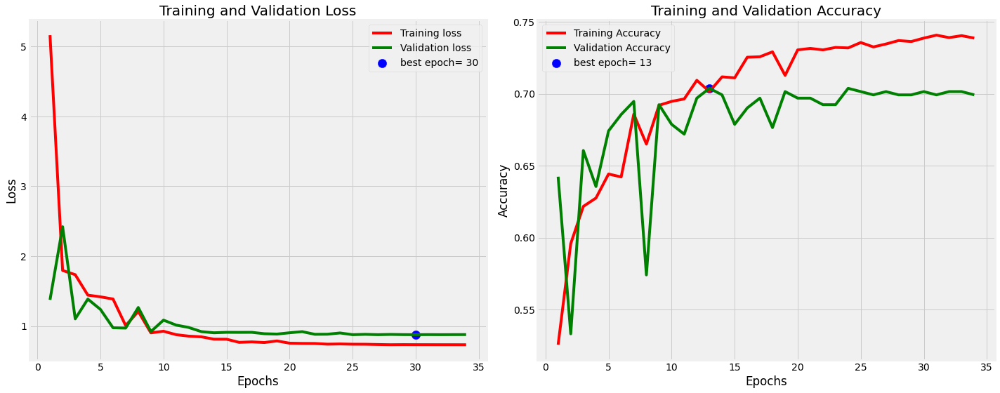

In [38]:
tr_acc = custom_history.history['accuracy']
tr_loss = custom_history.history['loss']
val_acc = custom_history.history['val_accuracy']
val_loss = custom_history.history['val_loss']

index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

plt.figure(figsize=(20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label='Training loss')
plt.plot(Epochs, val_loss, 'g', label='Validation loss')
plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label='Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label='Validation Accuracy')
plt.scatter(index_acc + 1, acc_highest, s=150, c='blue', label=acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [37]:
X_train_features = custom_model_1.predict(tr_gen)

ValueError: Failed to find data adapter that can handle input: <class 'keras.preprocessing.image.ImageDataGenerator'>, <class 'NoneType'>

In [29]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = custom_model_1.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = custom_model_1.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = custom_model_1.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

6/6 [==============================] - 6s 1s/step - loss: 0.9559 - accuracy: 0.6615
Train Loss:  0.7947409749031067
Train Accuracy:  0.7135416865348816
--------------------
Validation Loss:  0.7305206656455994
Validation Accuracy:  0.7447916865348816
--------------------
Test Loss:  0.9559242129325867
Test Accuracy:  0.6614583134651184


In [30]:
preds = custom_model_1.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

In [36]:
X_train_features = custom_model_1.predict(custom_model_1.)
X_test_features = custom_model_1.predict(test_df)

ValueError: in user code:

    C:\Anaconda\envs\gpu\lib\site-packages\keras\engine\training.py:1586 predict_function  *
        return step_function(self, iterator)
    C:\Anaconda\envs\gpu\lib\site-packages\keras\engine\training.py:1576 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    C:\Anaconda\envs\gpu\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:1286 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    C:\Anaconda\envs\gpu\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:2849 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    C:\Anaconda\envs\gpu\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:3632 _call_for_each_replica
        return fn(*args, **kwargs)
    C:\Anaconda\envs\gpu\lib\site-packages\keras\engine\training.py:1569 run_step  **
        outputs = model.predict_step(data)
    C:\Anaconda\envs\gpu\lib\site-packages\keras\engine\training.py:1537 predict_step
        return self(x, training=False)
    C:\Anaconda\envs\gpu\lib\site-packages\keras\engine\base_layer.py:1020 __call__
        input_spec.assert_input_compatibility(self.input_spec, inputs, self.name)
    C:\Anaconda\envs\gpu\lib\site-packages\keras\engine\input_spec.py:266 assert_input_compatibility
        raise ValueError('Input ' + str(input_index) +

    ValueError: Input 0 is incompatible with layer sequential_1: expected shape=(None, 224, 224, 3), found shape=(None, 2)


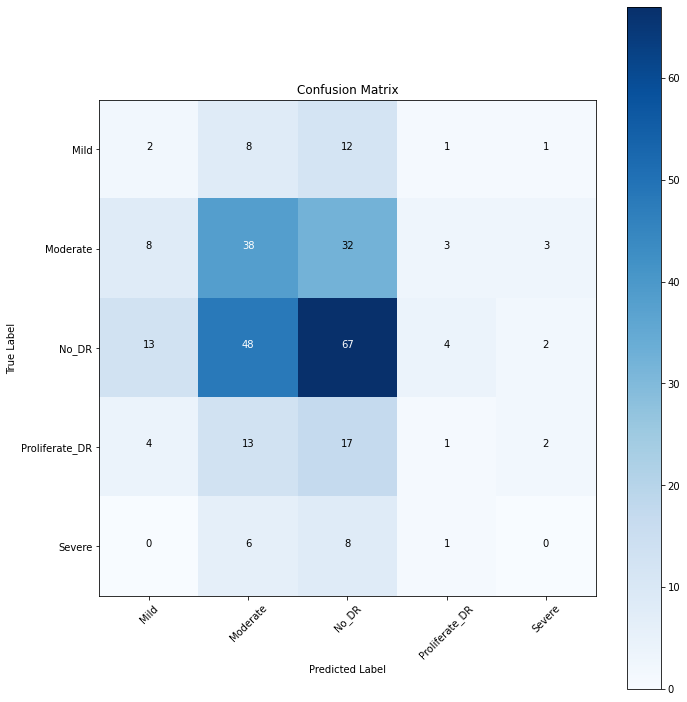

In [31]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [32]:
print(classification_report(test_gen.classes, y_pred, target_names= classes))

                precision    recall  f1-score   support

          Mild       0.07      0.08      0.08        24
      Moderate       0.34      0.45      0.39        84
         No_DR       0.49      0.50      0.50       134
Proliferate_DR       0.10      0.03      0.04        37
        Severe       0.00      0.00      0.00        15

      accuracy                           0.37       294
     macro avg       0.20      0.21      0.20       294
  weighted avg       0.34      0.37      0.35       294



In [33]:
model_name = custom_model.input_names[0][:-6]
subject = 'Diabetic Retinopathy Detection'
acc = test_score[1] * 100

# Save model
save_id = str(f'{model_name}-{subject}-{"%.2f" %round(acc, 2)}.h5')
model_save_loc = os.path.join('', save_id)
custom_model.save(model_save_loc)
print(f'model was saved as {model_save_loc}')

# Save weights
weight_save_id = str(f'{model_name}-{subject}-weights.h5')
weights_save_loc = os.path.join('', weight_save_id)
custom_model.save_weights(weights_save_loc)
print(f'weights were saved as {weights_save_loc}')

model was saved as i-Diabetic Retinopathy Detection-66.15.h5
weights were saved as i-Diabetic Retinopathy Detection-weights.h5


In [34]:
class_dict = train_gen.class_indices
img_size = train_gen.image_shape
height = []
width = []
for _ in range(len(class_dict)):
    height.append(img_size[0])
    width.append(img_size[1])

Index_series = pd.Series(list(class_dict.values()), name= 'class_index')
Class_series = pd.Series(list(class_dict.keys()), name= 'class')
Height_series = pd.Series(height, name= 'height')
Width_series = pd.Series(width, name= 'width')
class_df = pd.concat([Index_series, Class_series, Height_series, Width_series], axis= 1)
csv_name = f'{subject}-class_dict_custom_model_2.csv'
csv_save_loc = os.path.join(save_path, csv_name)
class_df.to_csv(csv_save_loc, index= False)
print(f'class csv file was saved as {csv_save_loc}')

class csv file was saved as C:/Users/Aum Sathwara/Documents/Aum/Workplace/Python/PROJECTS/Deep Learning Project\Diabetic Retinopathy Detection-class_dict_custom_model_2.csv
